# Installing CLIP & Import Necessary Libs

In [2]:
%pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-g2pkp_5e
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-g2pkp_5e
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.9 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=a3b27c8ccd417e442b1a1c85a03d7a9aca577119bba3d6ef20521975a1ebe3da
  Stored in directory: /tmp/pip-ephem-wheel-cache-skbp2_ep/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [3]:
import torch
from torch import nn
import torch.nn.functional as F
import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Relevancy Maps
In the following code block we analyze three different ways of how a given input image is "seen" by CLIP.

1. The first method simply looks at ViT's penultimate transformer block's activations.

2. The second method looks at gradients of each patch obtained from the backward operation applied on the cosine similarity score betweem the image and text (normalized) features outputs from the vision and text encoders, respectively.

3. The third method combined method 1 and 2 and simply computes a product between the two i.e., Gradient x Activation.

In [38]:
def visualize_relevancy_map(image_path, classname, model, preprocess, adapter=None):
  # load and preprocess image
  image = Image.open(image_path).convert('RGB')
  image_tensor = preprocess(image).unsqueeze(0).to(DEVICE)

  num_blocks = len(model.visual.transformer.resblocks)
  penult_idx = num_blocks - 2
  pen_block = model.visual.transformer.resblocks[penult_idx]

  saved = {}


  def penult_hook(module, input, output):
      out = output

      # keeping gradients after .backward() such that to use them later
      out.retain_grad()
      saved['penult_out'] = out


  # register forward hook
  handle = pen_block.register_forward_hook(penult_hook)

  # forward pass
  image_feature = model.encode_image(image_tensor)  # [1, 512]
  text_tokens = clip.tokenize([f"a photo of a {classname}, a type of flower."]).to(DEVICE)
  text_feature = model.encode_text(text_tokens)  # [1, 512]

  # pass image features through CLIP-adapter if passed as a parameter
  if adapter is not None:
    adapted = adapter(image_feature.float()).to(image_feature.dtype)
    image_feature = 0.4 * adapted + 0.6 * image_feature

  # normalize both image and text features
  image_features = image_feature / image_feature.norm(dim=-1, keepdim=True)
  text_features = text_feature / text_feature.norm(dim=-1, keepdim=True)

  # compute logits (cos. sim. score between image and text features)
  logit_scale = model.logit_scale.exp() if hasattr(model, "logit_scale") else 100.0
  sim = logit_scale * (image_features @ text_features.t()).squeeze()  # scalar
  print(f"Similarity score: {sim.item()}")

  # backprop
  model.zero_grad()
  sim.backward(retain_graph=False)

  pen_out = saved['penult_out']  # [197, 1, 768]
  handle.remove()

  # retrieving patches
  pen_grad = pen_out.grad

  # drop CLS token
  pen_patches = pen_out[1:, :, :].permute(1, 0, 2)
  pen_grads = pen_grad[1:, :, :].permute(1, 0, 2)

  # Method 1, relevance as gradient * patch, i.e.:
  # relevance[i] = Sum_d activation[i, d] * gradient[i, d]
  relevance_grad_act = (pen_patches * pen_grads).sum(dim=-1).squeeze(0)

  # Method 2, relevance as gradients only
  relevance_grad = pen_grads.norm(dim=-1).squeeze(0)

  # Method 3, relevance as activations only
  relevance_act = pen_patches.norm(dim=-1).squeeze(0)


  # Releveancy map methods as (data, method name)
  methods = [
      (relevance_grad_act.cpu().detach().numpy(), "Gradient x Activation"),
      (relevance_grad.cpu().detach().numpy(), "Gradient"),
      (relevance_act.cpu().detach().numpy(), "Activation"),
  ]

  num_patches = 14  # ViT-B/16 uses divides the input image into 14x14 patches

  # computing heatmaps for each method
  heatmaps = []

  for rel_data, method_name in methods:
      # reshape to CLIP image size (14x14)
      relevance = rel_data.reshape(num_patches, num_patches)
      # apply ReLU
      relevance = np.maximum(relevance, 0.0)
      # normalize values in [0..1] for plotting and understandability
      rel_max, rel_min = relevance.max(), relevance.min()
      if rel_max > rel_min:
          relevance = (relevance - rel_min) / (rel_max - rel_min + 1e-8)
      else:
          relevance = np.zeros_like(relevance)
      heatmaps.append(relevance)

  # plotting the results by comparing the 3 methods next to eachother
  fig, axes = plt.subplots(1, 3, figsize=(3 * 5, 5))
  fig.suptitle(f"Class: {classname}", fontsize=16, fontweight="bold")


  if len(heatmaps) == 1:
      axes = [axes]

  for i, (heatmap, method_name) in enumerate(zip(heatmaps, [m[1] for m in methods])):
      rel_img_resized = Image.fromarray((heatmap * 255).astype(np.uint8)).resize(
          image.size, resample=Image.BICUBIC
      )
      rel_arr_resized = np.array(rel_img_resized) / 255.0
      axes[i].imshow(image)
      axes[i].imshow(rel_arr_resized, cmap='jet', alpha=0.45)
      axes[i].set_title(f"Overlay: {method_name}")
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()

# Instantiate CLIP model and show relevancy results

Similarity score: 32.1533203125


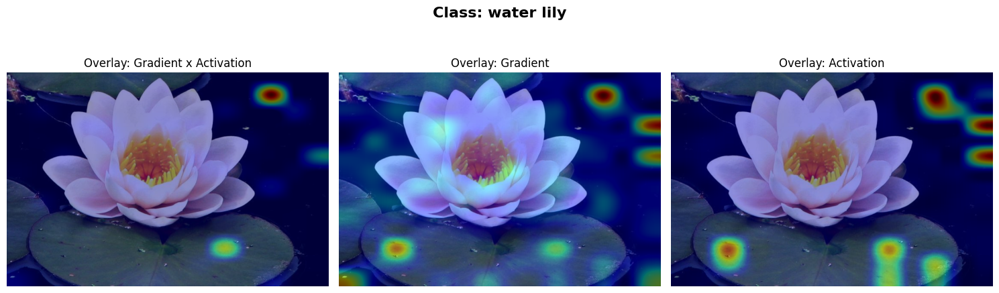

Similarity score: 32.51953125


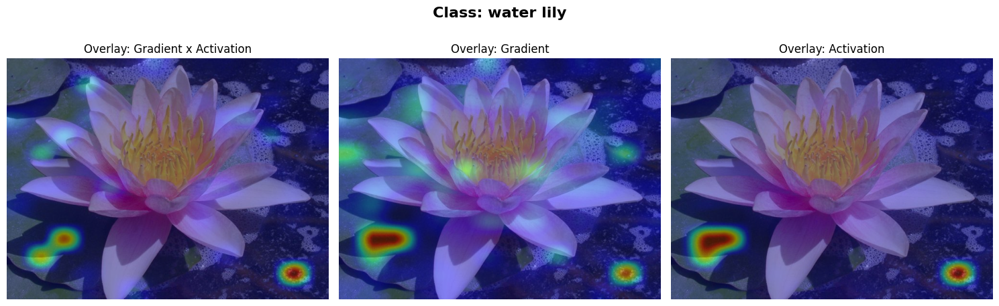

Similarity score: 31.7626953125


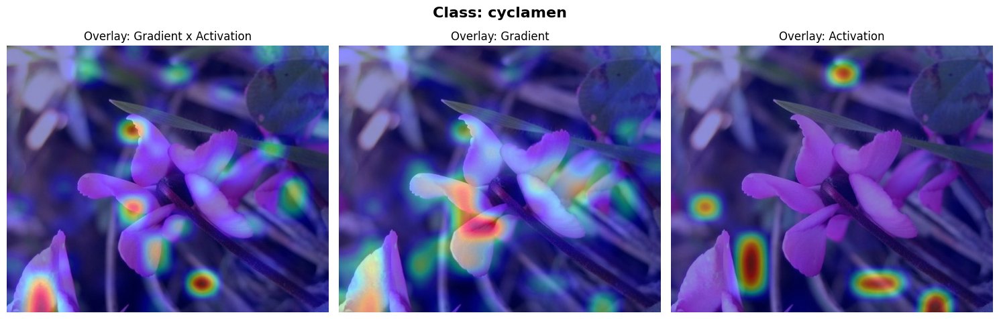

Similarity score: 31.787109375


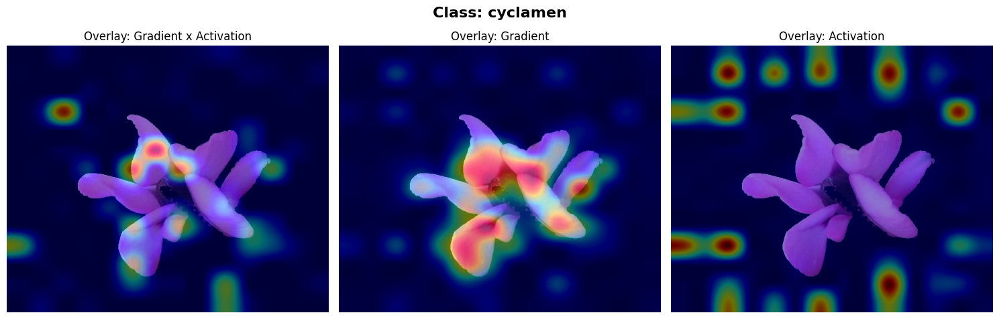

Similarity score: 36.181640625


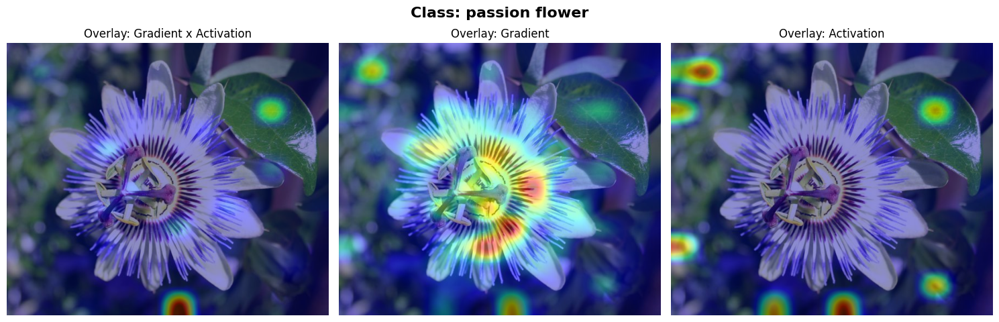

Similarity score: 37.060546875


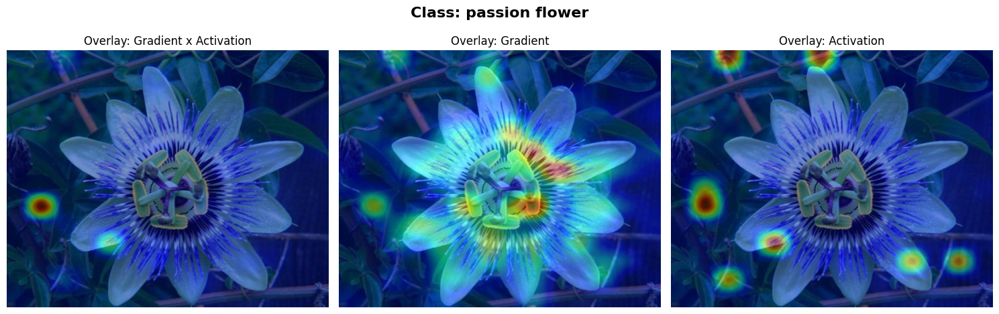

Similarity score: 34.5703125


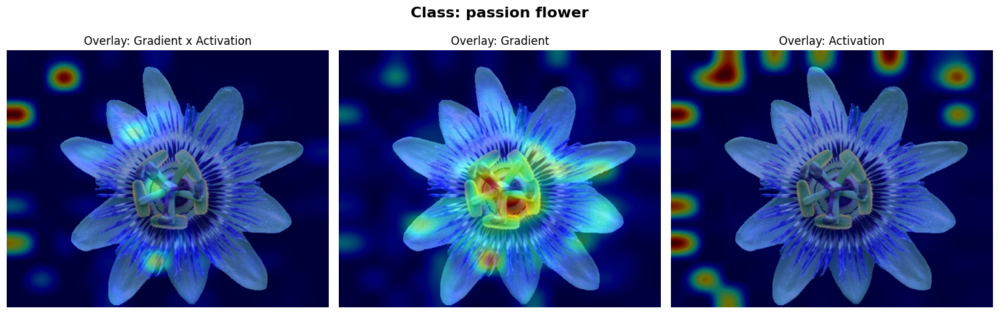

In [10]:
# config
MODEL_NAME = "ViT-B/16"

# image to process
image_paths = ["./water lily_2.jpg",
               "water lily_1.jpg",
               "cyclamen_1.jpg",
               "cyclamen_1_segmented.jpg",
               "passion_flower_1.jpg",
               "passion_flower_2.jpg",
               "passion_flower_2_segmented.jpg"]
prompts = ["water lily", "water lily", "cyclamen", "cyclamen", "passion flower", "passion flower", "passion flower"]

# load model
model, preprocess = clip.load(MODEL_NAME, device=DEVICE, jit=False)
model.eval()
# ensuring gradients flow:
for param in model.parameters():
   param.requires_grad_(True)

for image_path, prompt in zip(image_paths, prompts):
  visualize_relevancy_map(image_path, prompt, model, preprocess)

# Loading CLIP Adapter

In [5]:
class Adapter(nn.Module):
    def __init__(self, c_in, reduction=4, dropout=0.5):
        super(Adapter, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(in_features=c_in, out_features=c_in // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(in_features=c_in // reduction, out_features=c_in, bias=False),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.fc(x)
        return x

Similarity score: 31.298828125


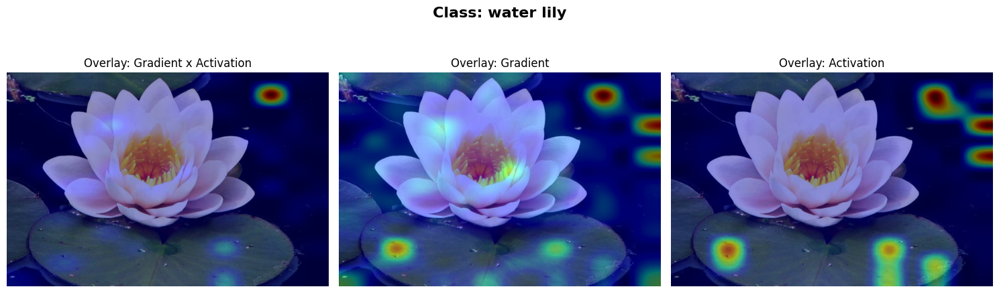

Similarity score: 32.3974609375


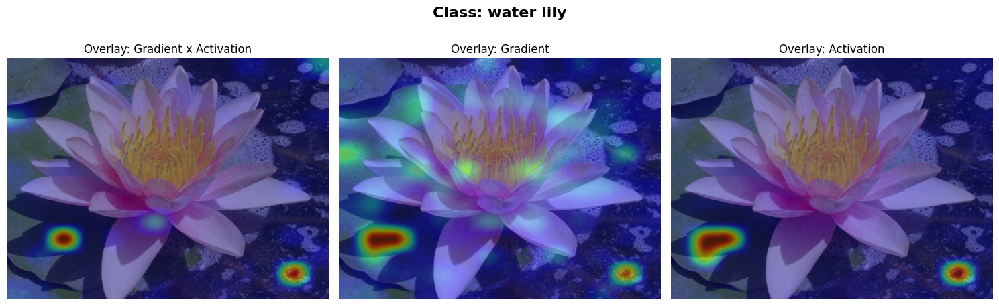

Similarity score: 30.17578125


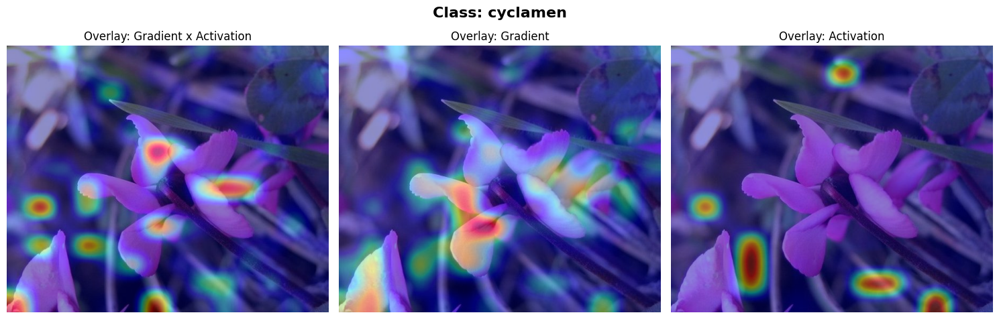

Similarity score: 28.6376953125


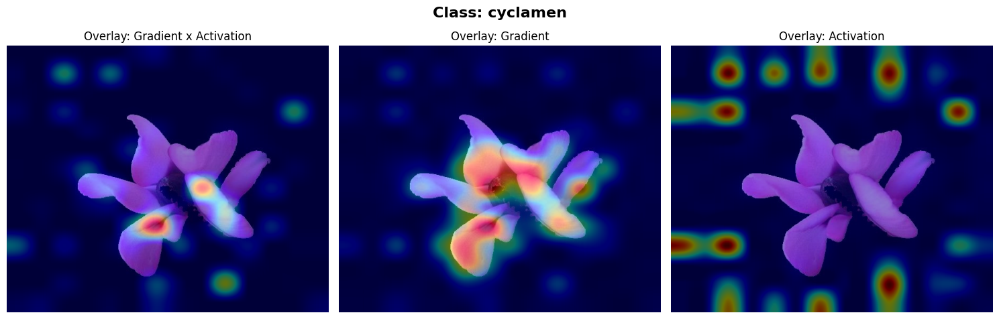

Similarity score: 34.130859375


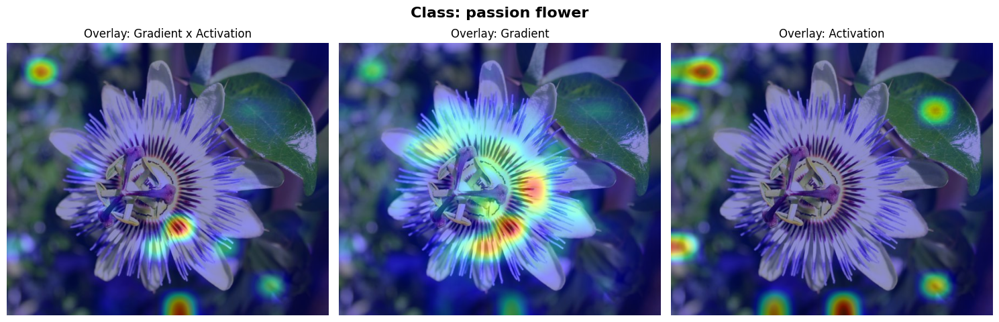

Similarity score: 29.2724609375


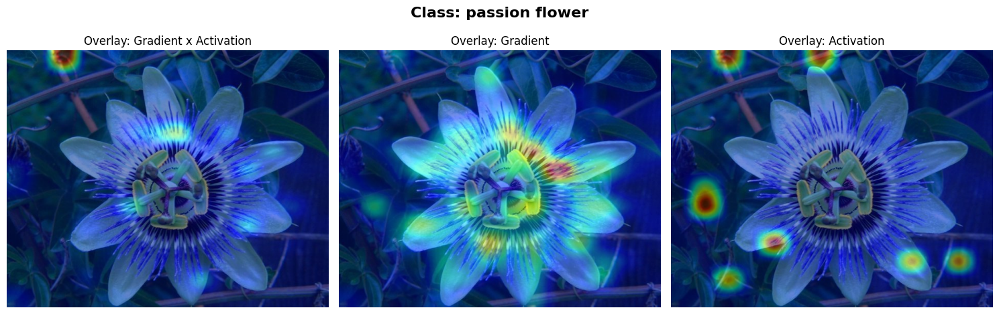

Similarity score: 29.7607421875


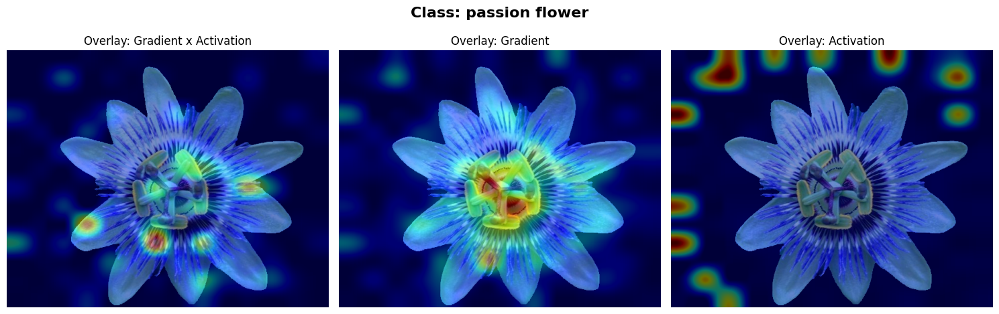

In [40]:
adapter = Adapter(
    c_in=512, # ViT/b-16 embedding dimension
    reduction=4,
).to(DEVICE)

adapter.load_state_dict(torch.load("./adapter_weights.pt"))

for image_path, prompt in zip(image_paths, prompts):
  visualize_relevancy_map(image_path, prompt, model, preprocess, adapter)

In [25]:
def visualize_attn_rollout_map(model, preprocess, image_path, classname, adapter=None):
  # load image and get embedded prompt
  img = Image.open(image_path).convert("RGB")
  img_tensor = preprocess(img).unsqueeze(0).to(DEVICE)
  img_tensor.requires_grad_(True)
  text_tokens = clip.tokenize([f"a photo of a {classname}, a type of flower."]).to(DEVICE)
  text_features = model.encode_text(text_tokens)
  text_features = text_features / text_features.norm(dim=-1, keepdim=True)

  # extract attention maps using hooks on from the MultiheadAttention module
  attn_maps = []

  # extract attention maps using hooks on from the MultiheadAttention module
  attn_maps = []

  def attention_hook(module, input, output):
      # computing attention weights manually as PyTorch's MHA doesn't return them by default
      x = input[0]  # input tensor [197, batch, 768]

      seq_len, batch, embed_dim = x.shape

      # get Q, K, V from the input (x)
      qkv = F.linear(x, module.in_proj_weight, module.in_proj_bias)  # [197, batch, 768 * 3]
      q, k, v = qkv.chunk(3, dim=-1)
      # print(f"q shape: {q.shape}")
      # print(f"k shape: {k.shape}")
      # print(f"v shape: {v.shape}")

      # Reshape for multi-head attention
      head_dim = embed_dim // module.num_heads  # 64 i.e., 768 / 12
      # print(f"head_dim: {head_dim}")
      q = q.view(seq_len, batch, module.num_heads, head_dim).transpose(0, 1).transpose(1, 2)  # [batch, num_heads, seq_len, head_dim]
      k = k.view(seq_len, batch, module.num_heads, head_dim).transpose(0, 1).transpose(1, 2)
      v = v.view(seq_len, batch, module.num_heads, head_dim).transpose(0, 1).transpose(1, 2)

      # self-attention i.e. softmax((q*k^t) / sqrt(d))
      attn_weights = torch.matmul(q, k.transpose(-2, -1)) / (head_dim ** 0.5)
      attn_weights = F.softmax(attn_weights, dim=-1)

      # save attention weights
      attn_maps.append(attn_weights.detach())


  # register hooks
  handles = []
  for blk in model.visual.transformer.resblocks:
      handle = blk.attn.register_forward_hook(attention_hook)
      handles.append(handle)

  # forward pass
  img_features = model.encode_image(img_tensor)

  # pass image features through CLIP-adapter if passed as a parameter
  if adapter is not None:
    adapted = adapter(img_features.float()).to(img_features.dtype)
    img_features = 0.4 * adapted + 0.6 * img_features

  img_features = img_features / img_features.norm(dim=-1, keepdim=True)
  img_features.retain_grad()

  # compute CLS-text score and backpropagate
  logit_scale = model.logit_scale.exp()
  score = (logit_scale * (img_features @ text_features.t())).squeeze()
  model.zero_grad()
  score.backward()
  cls_grad = img_features.grad  # [1, 512]

  # print(f"Captured {len(attn_maps)} attention maps")
  # print(f"First attention map shape: {attn_maps[0].shape}")

  # process attention maps
  processed_attn_maps = []
  for attn in attn_maps:
      # attn shape: [batch, 12, seq_len, seq_len]
      # average attention maps over heads and exclude CLS patch
      attn_avg = attn.mean(dim=1)  # [batch, seq_len, seq_len]
      patch_attn = attn_avg[:, 1:, 1:]  # [batch, 196, 196]
      processed_attn_maps.append(patch_attn)

  # rollout through layers
  rollout = processed_attn_maps[0]
  for i in range(1, len(processed_attn_maps)):
      rollout = rollout @ processed_attn_maps[i]

  # rollout now has shape [batch, 196, 196]

  # get CLS to patch attention for the final layer to weight the rollout
  cls_to_patch_final = attn_maps[-1][:, :, 0, 1:].mean(dim=1)  # [batch, 196]

  # apply CLS attention to the rollout result
  # weight each patch by how much CLS attends to it
  rollout_weighted = cls_to_patch_final.unsqueeze(1) @ rollout  # [batch, 1, 196]
  rollout_final = rollout_weighted.squeeze(1)  # [batch, 196]

  # weight rollout by CLS gradient norm
  grad_weights = cls_grad.norm(dim=-1, keepdim=True)
  rollout_cond = rollout_final * grad_weights
  rollout_cond = rollout_cond / rollout_cond.max(dim=-1, keepdim=True)[0]

  # reshape rollout to grid and overlay heatmap
  num_patches = rollout_cond.shape[-1]
  grid_size = int(np.sqrt(num_patches))

  print(f"Number of patches: {num_patches}, Grid size: {grid_size}")
  print(f"Rollout shape: {rollout_cond.shape}")

  # build heatmap
  heatmap = rollout_cond[0].cpu().numpy().reshape(grid_size, grid_size)
  heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
  heat_img = Image.fromarray((heatmap*255).astype(np.uint8), mode='L')
  heat_img = heat_img.resize(img.size, resample=Image.BICUBIC)
  heat_arr = np.array(heat_img) / 255.0

  plt.figure(figsize=(15, 5))

  # input image
  plt.subplot(1, 3, 1)
  plt.imshow(img)
  plt.axis("off")
  plt.title("Original Image")

  # heatmap only
  plt.subplot(1, 3, 2)
  plt.imshow(heatmap, cmap="jet")
  plt.axis("off")
  plt.title("Attention Heatmap")
  plt.colorbar()

  # heatmap over original image
  plt.subplot(1, 3, 3)
  plt.imshow(img)
  plt.imshow(heat_arr, cmap="jet", alpha=0.45)
  plt.axis("off")
  plt.title(f"Attention Overlay\n'{classname}'")

  plt.tight_layout()
  plt.show()

  # remove hooks
  for handle in handles:
      handle.remove()

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


/tmp/ipython-input-1133759155.py:112: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  heat_img = Image.fromarray((heatmap*255).astype(np.uint8), mode='L')


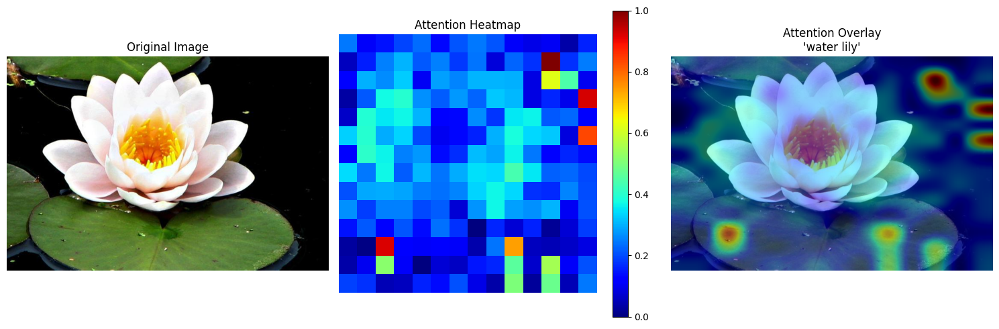

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


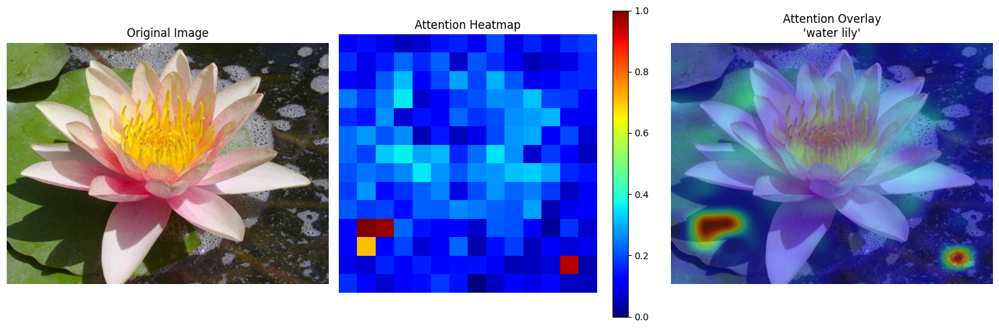

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


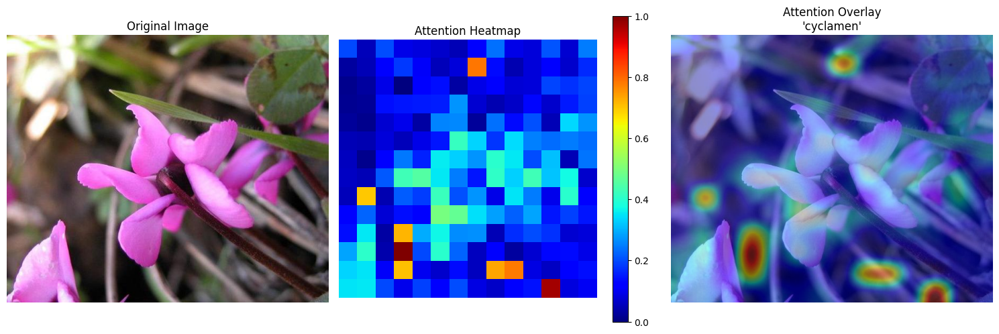

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


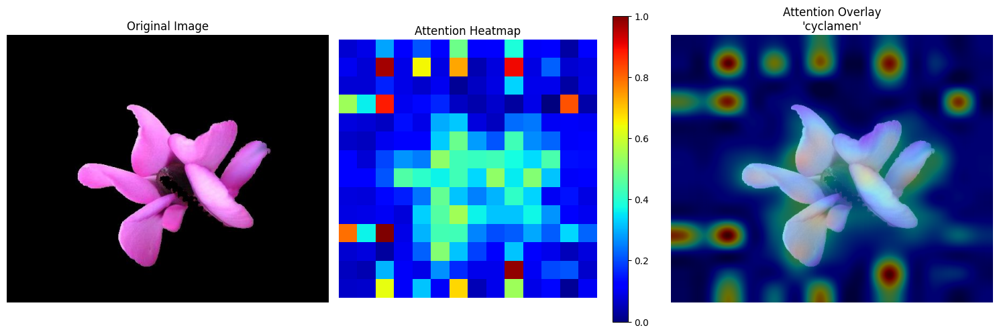

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


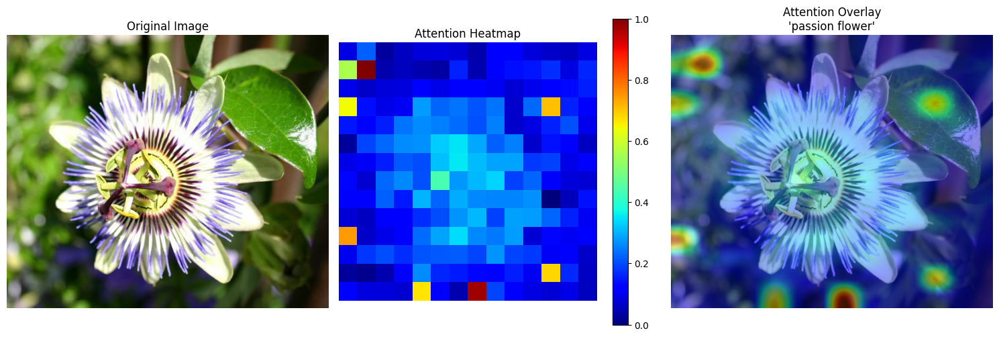

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


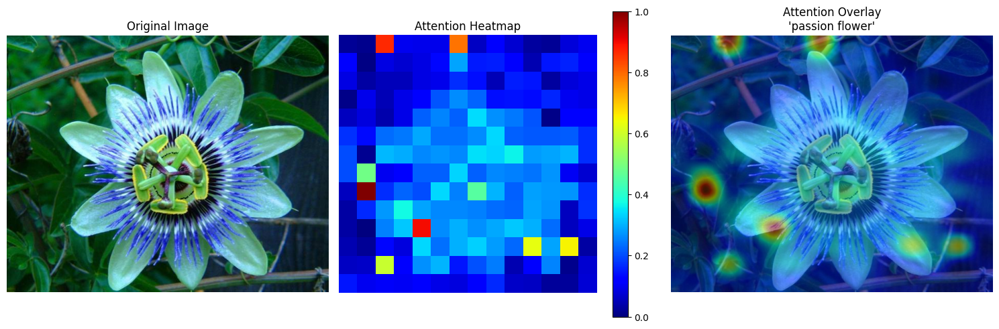

Number of patches: 196, Grid size: 14
Rollout shape: torch.Size([1, 196])


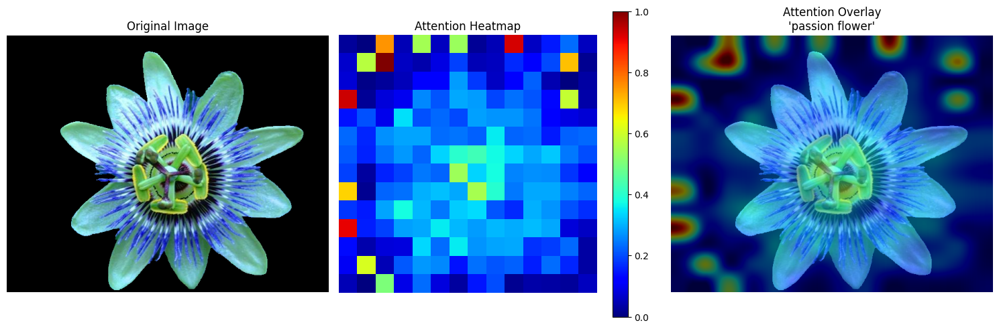

In [12]:
for image_path, prompt in zip(image_paths, prompts):
  visualize_attn_rollout_map(model, preprocess, image_path, prompt)